In [49]:
%pylab inline
import warnings
warnings.filterwarnings('ignore')

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [50]:
!pip install piq

You should consider upgrading via the '/home/dmitrypogrebnoy/Desktop/AdvancedML_ITMO_Cource_2/venv/bin/python -m pip install --upgrade pip' command.


In [51]:
!git clone https://github.com/aigagror/ML-Aesthetics-NIMA.git

fatal: destination path 'ML-Aesthetics-NIMA' already exists and is not an empty directory.


In [52]:
!ls ./data

pic10_3.jpeg  pic14_4.jpg   pic17_5.jpg  pic2_4.jpg  pic6_5.jpg
pic11_3.jpg   pic15_2.jpg   pic18_4.jpg  pic3_1.jpg  pic7_4.jpg
pic12_5.jpg   pic1_5.jpg    pic19_1.jpg  pic4_5.jpg  pic8_2.jpeg
pic13_5.jpg   pic16_3.jpeg  pic20_4.jpg  pic5_2.jpg  pic9_1.jpeg


In [53]:
from numpy import sort
import os

files = os.listdir("./data")
img_qa = {}
files = sort(files)
for f in files:
    parts = f.split("_")
    if len(parts) > 1:
        q = parts[-1].split(".")[0]
        img_qa[f] = int(q)

In [54]:
img_qa

{'pic10_3.jpeg': 3,
 'pic11_3.jpg': 3,
 'pic12_5.jpg': 5,
 'pic13_5.jpg': 5,
 'pic14_4.jpg': 4,
 'pic15_2.jpg': 2,
 'pic16_3.jpeg': 3,
 'pic17_5.jpg': 5,
 'pic18_4.jpg': 4,
 'pic19_1.jpg': 1,
 'pic1_5.jpg': 5,
 'pic20_4.jpg': 4,
 'pic2_4.jpg': 4,
 'pic3_1.jpg': 1,
 'pic4_5.jpg': 5,
 'pic5_2.jpg': 2,
 'pic6_5.jpg': 5,
 'pic7_4.jpg': 4,
 'pic8_2.jpeg': 2,
 'pic9_1.jpeg': 1}

# Show all pics with labels

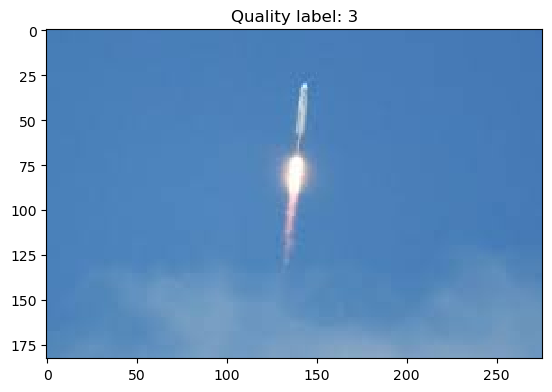

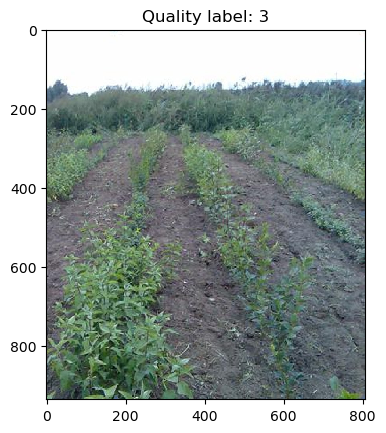

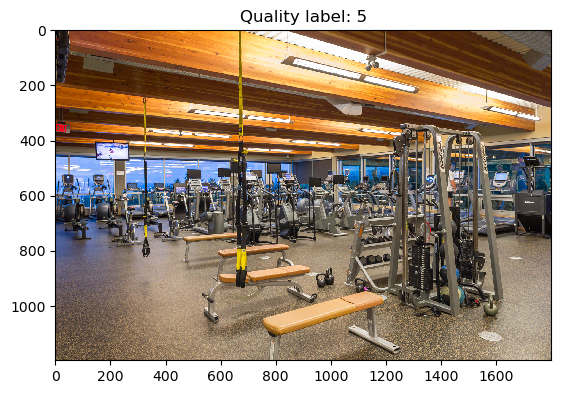

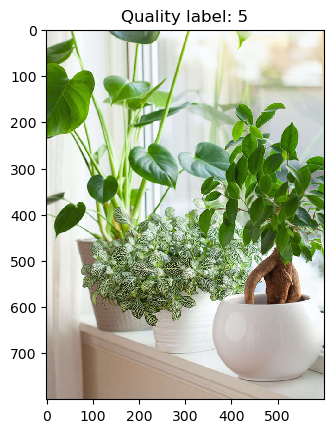

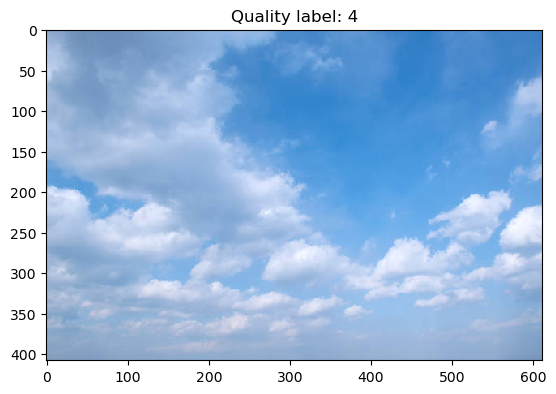

...

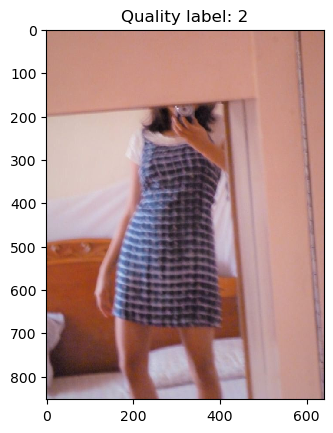

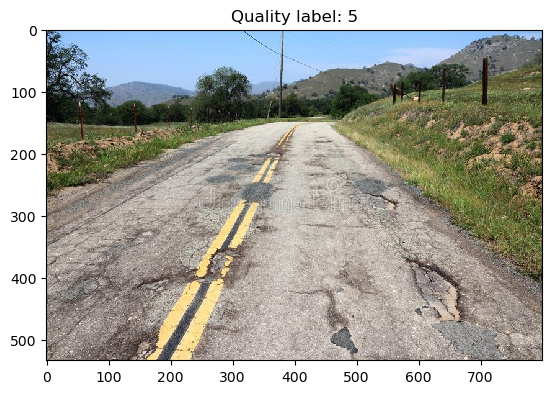

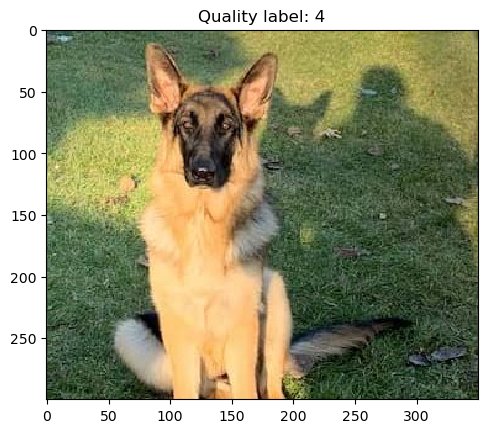

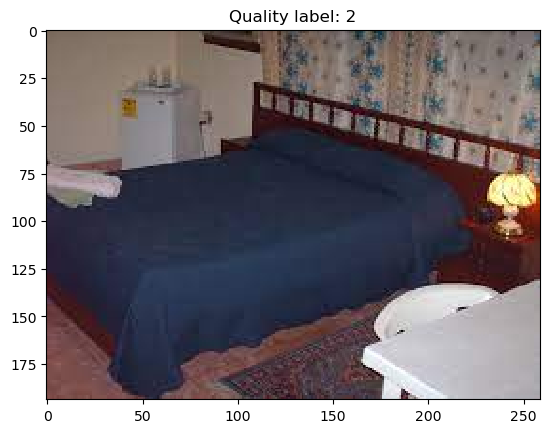

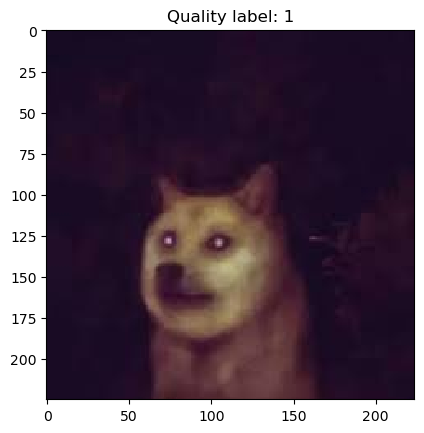

In [55]:
import numpy as np
from matplotlib import image as mpimg, pyplot as plt
%matplotlib inline
for img, qa in img_qa.items():
    img1 = mpimg.imread("./data/" + img)
    plt.title("Quality label: {}".format(qa))
    plt.imshow(img1)
    plt.show()

In [56]:
img_qa.values()

dict_values([3, 3, 5, 5, 4, 2, 3, 5, 4, 1, 5, 4, 4, 1, 5, 2, 5, 4, 2, 1])

In [57]:
import torch
import piq
from skimage.io import imread

In [58]:
from main import rate

In [59]:
def compute_metrics(path, label):
    x = torch.tensor(imread(path)).permute(2, 0, 1)[None, ...] / 255.
    brisque_index: torch.Tensor = piq.brisque(x, data_range=1., reduction='none')
    tv_index: torch.Tensor = piq.total_variation(x)
    scores, mean, std = rate(path)

    metrics = {"image_name":path.split("/")[-1],
               "human_perception":label,
               "TV": tv_index.item(),
               "BRISQUE":brisque_index.item(),
               "NIMA_mean": mean,
               "NIMA_std": std}
    return metrics

In [60]:
res_list = []

In [61]:
os.putenv("CUDA_VISIBLE_DEVICES", "")

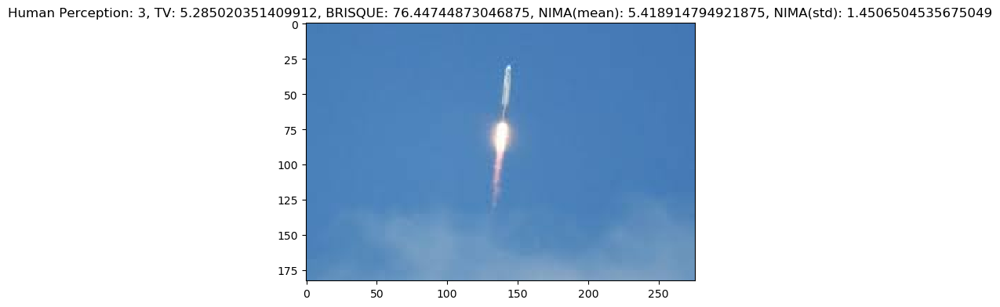

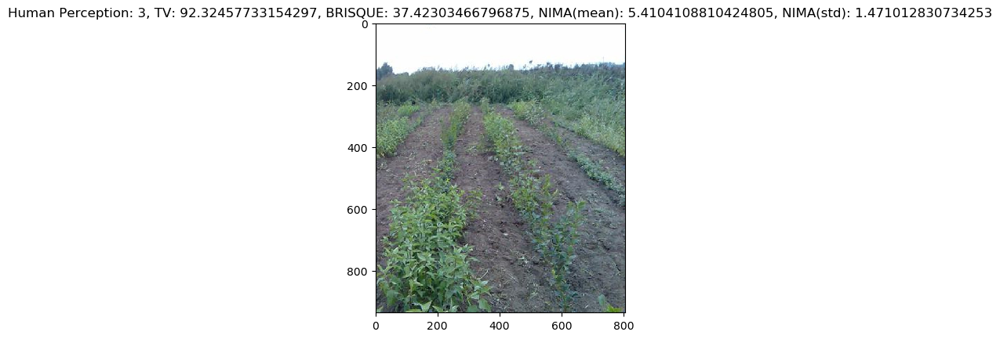

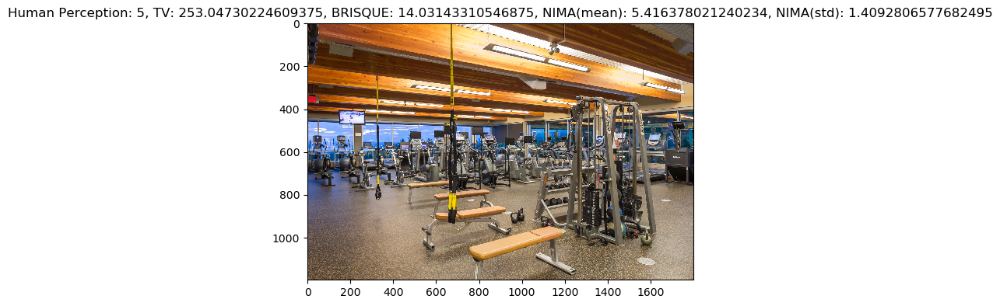

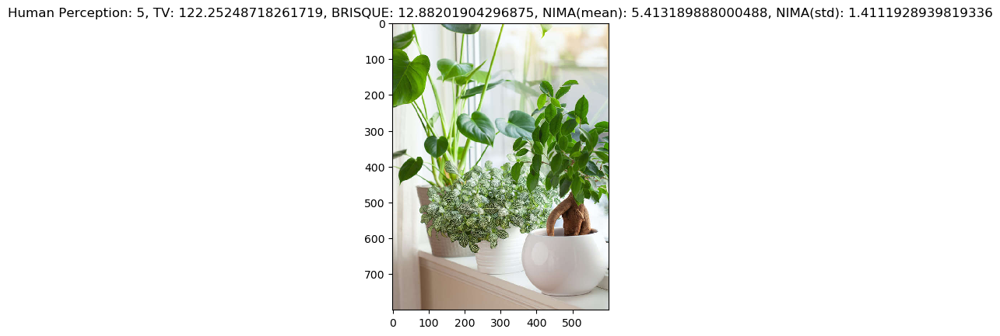

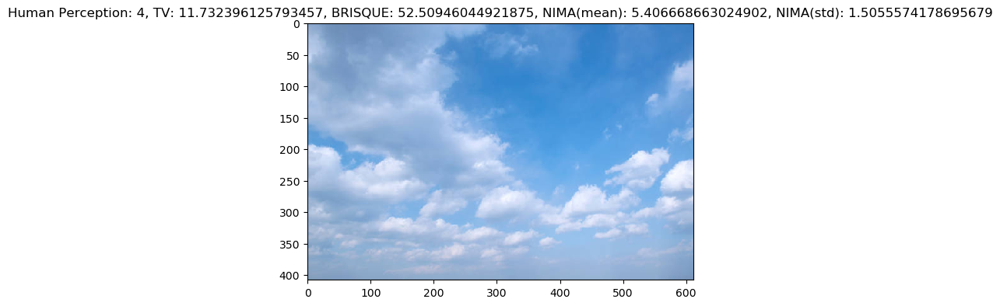

...

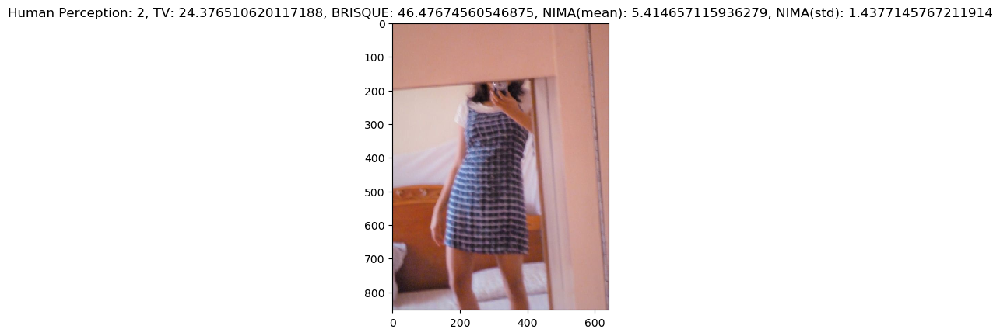

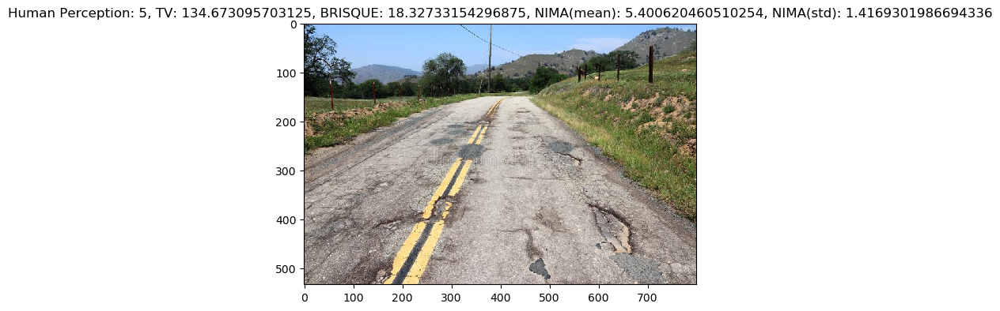

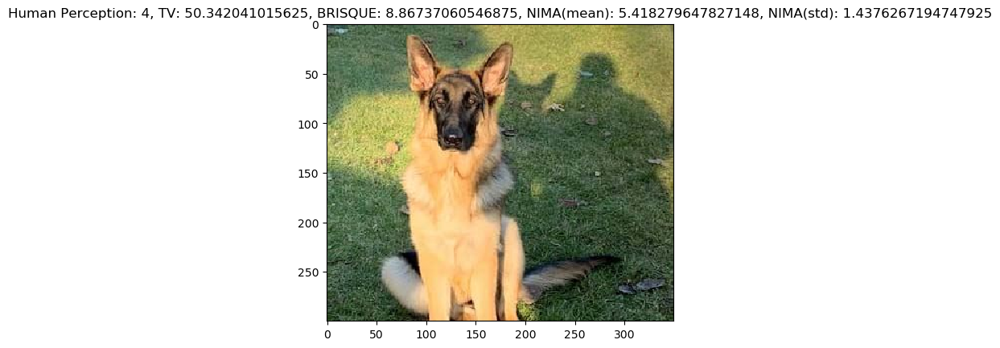

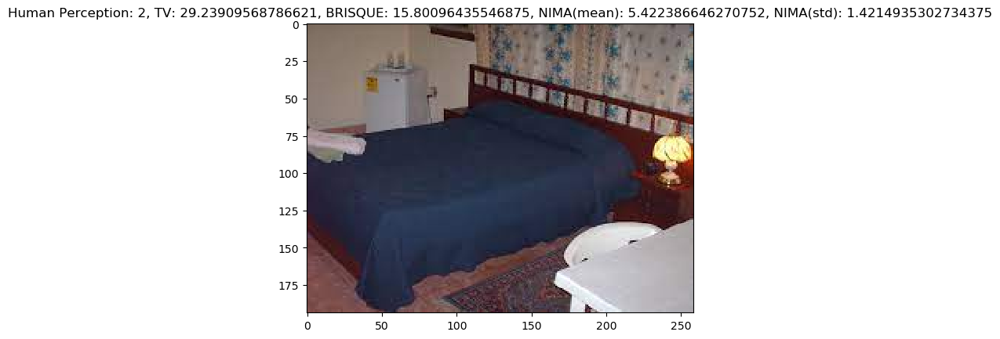

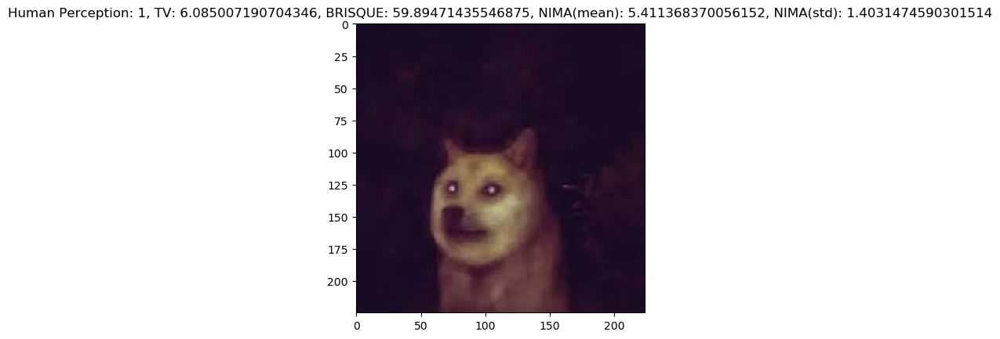

In [62]:
ignored = 0
for img, qa in img_qa.items():
    path = "./data/"+img
    try:
        d = compute_metrics(path, qa)
        res_list.append(d)
    except:
        print("ignoring: ", path)
        ignored += 1
        continue
    img = mpimg.imread(path)
    plt.title(f"Human Perception: {qa}, TV: {d['TV']}, BRISQUE: {d['BRISQUE']}, NIMA(mean): {d['NIMA_mean']}, NIMA(std): {d['NIMA_std']}")
    plt.imshow(img)
    plt.show()

In [64]:
import pandas as pd
df = pd.DataFrame(res_list)

In [65]:
df

,image_name,human_perception,TV,BRISQUE,NIMA_mean,NIMA_std
0,pic10_3.jpeg,3,5.285020,76.447449,5.418915,1.450650
1,pic11_3.jpg,3,92.324577,37.423035,5.410411,1.471013
2,pic12_5.jpg,5,253.047302,14.031433,5.416378,1.409281
3,pic13_5.jpg,5,122.252487,12.882019,5.413190,1.411193
4,pic14_4.jpg,4,11.732396,52.509460,5.406669,1.505557
5,pic15_2.jpg,2,29.455189,53.379578,5.411411,1.416729
6,pic16_3.jpeg,3,48.238228,38.890808,5.405235,1.414708
7,pic17_5.jpg,5,111.718254,13.606140,5.431877,1.442276
8,pic18_4.jpg,4,30.916615,38.724304,5.401586,1.476961
9,pic19_1.jpg,1,12.419295,78.124695,5.403044,1.465743


In [67]:
df.corr()

,human_perception,TV,BRISQUE,NIMA_mean,NIMA_std
human_perception,1.000000,0.678523,-0.557622,0.008506,-0.225252
TV,0.678523,1.000000,-0.656171,-0.041982,-0.335395
BRISQUE,-0.557622,-0.656171,1.000000,-0.182171,0.232212
NIMA_mean,0.008506,-0.041982,-0.182171,1.000000,-0.072713
NIMA_std,-0.225252,-0.335395,0.232212,-0.072713,1.000000


# Conclusion

Considering Pearson correlation I would like to say that TV has max corr score with human perception than other metric